In [1]:
import pandas as pd
import numpy as np
from nltk.tokenize import RegexpTokenizer
import re
from wordcloud import WordCloud
from PIL import Image
import altair as alt

ModuleNotFoundError: No module named 'nltk'

In [120]:
inmates = pd.read_parquet('./data/offense_inmate.parquet')
tattoos = pd.read_parquet('./data/tattoos.parquet')

In [ ]:
print(inmates.info())


In [7]:
print(tattoos.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 290608 entries, 0 to 290607
Data columns (total 3 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   DCNumber    290608 non-null  object
 1   Location    290608 non-null  object
 2   text_token  290608 non-null  object
dtypes: object(3)
memory usage: 6.7+ MB
None


In [ ]:
tatted_ids = {x: 1 for x in tattoos.DCNumber.unique()}
tatted_ids

In [7]:
inmates['is_tatted'] = [tatted_ids.get(x,0) for x in inmates['DCNumber'] ]

In [8]:
seq_offenses = inmates.groupby('DCNumber').agg({'Sequence':'max'}).reset_index()

In [9]:
multiple_offenses = seq_offenses.loc[seq_offenses['Sequence'] > 1]

In [10]:
multi_dict = {x: 1 for x in multiple_offenses['DCNumber']}
len(multi_dict)

82818

In [11]:
inmates['multi_offender'] = [multi_dict.get(x, 0) for x in inmates['DCNumber']]

In [15]:
inmates.groupby('multi_offender').agg('count')

,DCNumber,Sequence,OffenseDate,DateAdjudicated,County,CaseNumber,prisonterm,ProbationTerm,ParoleTerm,adjudicationcharge_descr,...,HairColor,EyeColor,Height,Weight,PrisonReleaseDate,ReceiptDate,releasedateflag_descr,custody_description,FACILITY_description,is_tatted
multi_offender,,,,,,,,,,,,,,,,,,,,,
0,14799,14799,14799,14799,14799,14793,14799,14799,14799,14799,...,14799,14799,14781,14792,12556,14799,14799,14338,14799,14799
1,654283,654283,654283,654276,654283,650195,654283,654283,654283,654283,...,654283,654283,653917,654218,566868,654283,654283,634374,654283,654283


In [13]:
inmates['is_tatted']

0         1
1         0
2         1
3         1
4         0
         ..
669077    1
669078    1
669079    1
669080    1
669081    1
Name: is_tatted, Length: 669082, dtype: int64

In [29]:
inmates.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 669082 entries, 0 to 669081
Data columns (total 26 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   DCNumber                  669082 non-null  object        
 1   Sequence                  669082 non-null  int64         
 2   OffenseDate               669082 non-null  datetime64[ns]
 3   DateAdjudicated           669075 non-null  datetime64[ns]
 4   County                    669082 non-null  object        
 5   CaseNumber                664988 non-null  float64       
 6   prisonterm                669082 non-null  int64         
 7   ProbationTerm             669082 non-null  int64         
 8   ParoleTerm                669082 non-null  int64         
 9   adjudicationcharge_descr  669082 non-null  object        
 10  qualifier_descr           669082 non-null  object        
 11  adjudication_descr        669082 non-null  object        
 12  Ra

In [38]:
inmates[['adjudication_descr','releasedateflag_descr']]

,adjudication_descr,releasedateflag_descr
0,ADJUDICATION NOT WITHHELD,valid release date
1,ADJUDICATION NOT WITHHELD,valid release date
2,ADJUDICATION NOT WITHHELD,valid release date
3,ADJUDICATION NOT WITHHELD,valid release date
4,ADJUDICATION NOT WITHHELD,valid release date
...,...,...
669077,ADJUDICATION NOT WITHHELD,valid release date
669078,ADJUDICATION NOT WITHHELD,valid release date
669079,ADJUDICATION NOT WITHHELD,valid release date
669080,ADJUDICATION NOT WITHHELD,valid release date


In [40]:
print(inmates[inmates['adjudication_descr'] != 'ADJUDICATION NOT WITHHELD'])

       DCNumber  Sequence OffenseDate DateAdjudicated      County  CaseNumber  \
25394    B08642         2  2009-08-24      2010-06-17  PALM BEACH    912416.0   
31344    I07005         4  2014-09-18      2015-02-09      ORANGE   1412756.0   
48961    I54393         5  2017-01-25      2017-08-04     BROWARD   1700989.0   
64182    M26259         4  2011-10-14      2013-10-31  MIAMI-DADE   1127445.0   
78504    G09816         2  2016-12-10      2017-05-02       BAKER   1600436.0   
...         ...       ...         ...             ...         ...         ...   
663633   X84115         6  2013-05-20      2013-10-18      ORANGE   1307160.0   
663680   X86878         3  2013-12-03      2014-08-19      ORANGE   1317071.0   
666678   Y24178         1  2001-06-06      2004-05-24         LEE    102309.0   
666679   Y24178         2  2001-06-01      2004-05-24         LEE    102481.0   
666680   Y24178         3  2001-05-08      2004-05-24         LEE    102651.0   

        prisonterm  Probati

In [41]:
inmates.is_tatted.aggregate('sum')

520864

In [42]:
inmates.multi_offender.aggregate('sum')

654283

In [17]:
inmates.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 669082 entries, 0 to 669081
Data columns (total 26 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   DCNumber                  669082 non-null  object        
 1   Sequence                  669082 non-null  int64         
 2   OffenseDate               669082 non-null  datetime64[ns]
 3   DateAdjudicated           669075 non-null  datetime64[ns]
 4   County                    669082 non-null  object        
 5   CaseNumber                664988 non-null  float64       
 6   prisonterm                669082 non-null  int64         
 7   ProbationTerm             669082 non-null  int64         
 8   ParoleTerm                669082 non-null  int64         
 9   adjudicationcharge_descr  669082 non-null  object        
 10  qualifier_descr           669082 non-null  object        
 11  adjudication_descr        669082 non-null  object        
 12  Ra

In [40]:
inmates.qualifier_descr.unique

<bound method Series.unique of 0                    PRINCIPAL
1                    PRINCIPAL
2                    PRINCIPAL
3         CONSPIRACY TO COMMIT
4                    PRINCIPAL
                  ...         
669077               PRINCIPAL
669078               PRINCIPAL
669079               PRINCIPAL
669080               PRINCIPAL
669081               PRINCIPAL
Name: qualifier_descr, Length: 669082, dtype: object>

In [23]:
inmates.loc[inmates['Sequence'] == 1,'multi_offender']

29        0
30        0
40        0
48        0
51        0
         ..
669075    0
669077    0
669078    0
669080    0
669081    0
Name: multi_offender, Length: 97592, dtype: int64

In [33]:
expression = '(\/)|(,)'
clean = inmates['adjudicationcharge_descr'].apply(lambda x: re.sub(string=x,pattern=expression,repl=' '))


In [36]:
inmates['charge_tokens'] = clean.apply(regexp.tokenize)

In [ ]:
expression = '\w+'
regexp = RegexpTokenizer(expression)
inmates['adjudicationcharge_descr'].apply(lambda x: re.sub(string=x,pattern=expression,repl=' ')).apply(regexp.tokenize)

In [45]:
inmates['releasedateflag_descr'].unique()

array(['valid release date', 'life sentence',
       'coterminous Florida and other state/federal custody',
       'death sentence', 'pending', 'to be set'], dtype=object)

In [50]:

life = inmates.loc[inmates['releasedateflag_descr'] == 'life sentence','DCNumber']
death = inmates.loc[inmates['releasedateflag_descr'] == 'death sentence','DCNumber']

In [58]:
inmates = pd.get_dummies(inmates,columns=['releasedateflag_descr'],prefix='flag')

In [38]:
['TRANSMITTER', '100K'] + ['TRANSMITTER', '100K'] 

['TRANSMITTER', '100K', 'TRANSMITTER', '100K']

In [59]:
inmates.groupby('DCNumber').agg({'Sequence':'max',
                                 'prisonterm':'sum',
                                 'ProbationTerm':'sum',
                                 'ParoleTerm':'sum',
                                 'Race':'max',
                                 'Sex':'max',
                                 'Height':'max',
                                 'Weight':'max',
                                 'HairColor':'max',
                                 'EyeColor':'max',
                                 'BirthDate':'max',
                                 'multi_offender':'max',
                                 'is_tatted':'max',
                                 'charge_tokens':'sum',
                                 'flag_death sentence':'max',
                                 'flag_life sentence':'max',
                                 })

,Sequence,prisonterm,ProbationTerm,ParoleTerm,Race,Sex,Height,Weight,HairColor,EyeColor,BirthDate,multi_offender,is_tatted,charge_tokens,flag_death sentence,flag_life sentence
DCNumber,,,,,,,,,,,,,,,,
000084,1,9999998,0,0,W,M,601.0,160.0,BLK,BRO,1940-01-01,0,0,"[1ST, DG, MUR, PREMED, OR, ATT]",0,1
000256,2,10069998,0,9999998,B,M,510.0,140.0,BLK,BRO,1944-06-28,1,0,"[1ST, DG, MUR, PREMED, OR, ATT, BURGUNOCCSTRUC...",0,1
000316,10,50299990,0,59999988,B,M,510.0,155.0,BLK,BRO,1937-12-30,1,0,"[BURGUNOCCSTRUC, CV, OR, ATT, BURGUNOCCSTRUC, ...",0,1
000371,15,2250000,40000,33027,B,M,600.0,230.0,BLK,BRO,1939-06-08,1,0,"[HUMAN, TRAFFICKING, LABOR, HUMAN, TRAFFICKING...",0,0
000664,6,10549998,0,39999992,B,M,508.0,140.0,BLK,BRO,1941-06-20,1,0,"[CONCEAL, STOLEN, PROPERTY, HEROIN, POSSESS, P...",0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Y63879,15,300000,470000,0,W,M,604.0,205.0,GRY,GRN,1977-06-05,1,1,"[FALS, INF, TO, PWNBRKR, 300, FALS, INF, TO, P...",0,0
Y63893,1,30000,200000,0,W,F,503.0,134.0,BLN,BRO,1982-08-17,0,1,"[GRAND, THEFT, O, 100K]",0,0
Y63927,3,180000,150000,0,W,M,506.0,183.0,GRY,BRO,1966-12-07,1,0,"[LAUNDER, 20K, 100K, CONS, TO, VIO, RACKTEERIN...",0,0


In [60]:
inmate_summary = inmates.groupby('DCNumber').agg({'Sequence':'max',
                                 'prisonterm':'sum',
                                 'ProbationTerm':'sum',
                                 'ParoleTerm':'sum',
                                 'Race':'max',
                                 'Sex':'max',
                                 'Height':'max',
                                 'Weight':'max',
                                 'HairColor':'max',
                                 'EyeColor':'max',
                                 'BirthDate':'max',
                                 'multi_offender':'max',
                                 'is_tatted':'max',
                                 'charge_tokens':'sum',
                                 'flag_death sentence':'max',
                                 'flag_life sentence':'max',
                                 })

In [61]:
inmate_summary

,Sequence,prisonterm,ProbationTerm,ParoleTerm,Race,Sex,Height,Weight,HairColor,EyeColor,BirthDate,multi_offender,is_tatted,charge_tokens,flag_death sentence,flag_life sentence
DCNumber,,,,,,,,,,,,,,,,
000084,1,9999998,0,0,W,M,601.0,160.0,BLK,BRO,1940-01-01,0,0,"[1ST, DG, MUR, PREMED, OR, ATT]",0,1
000256,2,10069998,0,9999998,B,M,510.0,140.0,BLK,BRO,1944-06-28,1,0,"[1ST, DG, MUR, PREMED, OR, ATT, BURGUNOCCSTRUC...",0,1
000316,10,50299990,0,59999988,B,M,510.0,155.0,BLK,BRO,1937-12-30,1,0,"[BURGUNOCCSTRUC, CV, OR, ATT, BURGUNOCCSTRUC, ...",0,1
000371,15,2250000,40000,33027,B,M,600.0,230.0,BLK,BRO,1939-06-08,1,0,"[HUMAN, TRAFFICKING, LABOR, HUMAN, TRAFFICKING...",0,0
000664,6,10549998,0,39999992,B,M,508.0,140.0,BLK,BRO,1941-06-20,1,0,"[CONCEAL, STOLEN, PROPERTY, HEROIN, POSSESS, P...",0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Y63879,15,300000,470000,0,W,M,604.0,205.0,GRY,GRN,1977-06-05,1,1,"[FALS, INF, TO, PWNBRKR, 300, FALS, INF, TO, P...",0,0
Y63893,1,30000,200000,0,W,F,503.0,134.0,BLN,BRO,1982-08-17,0,1,"[GRAND, THEFT, O, 100K]",0,0
Y63927,3,180000,150000,0,W,M,506.0,183.0,GRY,BRO,1966-12-07,1,0,"[LAUNDER, 20K, 100K, CONS, TO, VIO, RACKTEERIN...",0,0


In [62]:
def get_words(df, column='text_token'):
    return ' '.join(list(np.concatenate([c for c in df[column]]).flat))

In [67]:
all_charges_text = get_words(inmate_summary,column='charge_tokens')

In [109]:
def generate_wc(words,img = './data/flor_img_white.png'):
    mask = np.array(Image.open(img))
    wc = WordCloud(mode='RGBA',width=1800, height=800,background_color=None, max_words=2500, mask=mask,colormap='Set2')
    return wc.generate(words)

In [110]:
inmate_summary.to_parquet('./data/inmate_summary.parquet')

In [107]:
wc = generate_wc(all_charges_text,img = './data/florida_text_5.png')

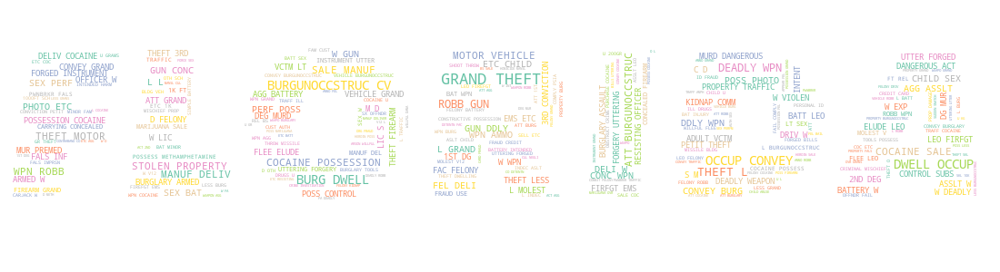

In [108]:
wc.to_image()

In [119]:
inmates.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 669082 entries, 0 to 669081
Data columns (total 32 columns):
 #   Column                                                    Non-Null Count   Dtype         
---  ------                                                    --------------   -----         
 0   DCNumber                                                  669082 non-null  object        
 1   Sequence                                                  669082 non-null  int64         
 2   OffenseDate                                               669082 non-null  datetime64[ns]
 3   DateAdjudicated                                           669075 non-null  datetime64[ns]
 4   County                                                    669082 non-null  object        
 5   CaseNumber                                                664988 non-null  float64       
 6   prisonterm                                                669082 non-null  int64         
 7   ProbationTerm                

In [123]:
release_bump = inmates.groupby([inmates.OffenseDate.dt.year,'releasedateflag_descr']).agg({'DCNumber':'count'}).reset_index(inplace=True)


In [151]:
inmates.groupby([inmates.OffenseDate.dt.year,'releasedateflag_descr']).agg({'DCNumber':'count'}).reset_index()

,OffenseDate,releasedateflag_descr,DCNumber
0,1900,life sentence,3
1,1900,valid release date,3
2,1944,life sentence,1
3,1945,life sentence,1
4,1950,life sentence,1
...,...,...,...
270,2016,to be set,345
271,2016,valid release date,38620
272,2017,life sentence,37
273,2017,to be set,231


In [140]:
release_bump = inmates.groupby([inmates.OffenseDate.dt.year,'releasedateflag_descr']).agg({'DCNumber':'count'}).reset_index(inplace=True)

In [141]:
type(bump)

NoneType

In [127]:
release_bump

,OffenseDate,releasedateflag_descr,DCNumber
0,1900,life sentence,3
1,1900,valid release date,3
2,1944,life sentence,1
3,1945,life sentence,1
4,1950,life sentence,1
...,...,...,...
270,2016,to be set,345
271,2016,valid release date,38620
272,2017,life sentence,37
273,2017,to be set,231


In [132]:
release_bump.loc[release_bump['OffenseDate'] > 1984]

,OffenseDate,releasedateflag_descr,DCNumber
98,1985,death sentence,34
99,1985,life sentence,1685
100,1985,pending,8
101,1985,to be set,45
102,1985,valid release date,3275
...,...,...,...
270,2016,to be set,345
271,2016,valid release date,38620
272,2017,life sentence,37
273,2017,to be set,231


In [133]:

alt.Chart(release_bump.loc[release_bump['OffenseDate'] > 1984]).mark_line(point = True).encode(
    x = alt.X("OffenseDate:O", title="date"),
    y="rank:O",
    color=alt.Color("releasedateflag_descr:N")
).transform_window(
    rank="rank()",
    sort=[alt.SortField("DCNumber", order="descending")],
    groupby=["OffenseDate"]
).properties(
    title="Bump Chart for Release Flag",
)

/opt/homebrew/Caskroom/miniforge/base/envs/dsba/lib/python3.10/site-packages/altair/utils/core.py:317: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for col_name, dtype in df.dtypes.iteritems():


alt.Chart(...)

## Topic Modeling

In [166]:
import sys
# !{sys.executable} -m spacy download en
from pprint import pprint

# Gensim
import gensim, spacy, logging, warnings
import gensim.corpora as corpora
from nltk.stem import WordNetLemmatizer
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
import matplotlib.pyplot as plt

In [167]:
%matplotlib inline
warnings.filterwarnings("ignore",category=DeprecationWarning)
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

In [153]:
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook

In [191]:
data_words = tattoos.text_token.values.tolist()
stop_words = ['hand','arm','forearm','chest','upper','right','left','back','leg','hand','foot','right','cheek','finger','neck']
data_words[8:1]

[]

## Building Biagram and Trigram models

In [176]:
bigram = gensim.models.Phrases(data_words,min_count=5, threshold=100)
trigram = gensim.models.Phrases(bigram[data_words],threshold=100)
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

In [197]:
def process_words(texts, stop_words=stop_words, allowed_postags=['SYM','NUM','PROPN','NOUN', 'ADJ', 'VERB', 'ADV']):
    """Remove Stopwords, Form Bigrams, Trigrams and Lemmatization"""
    texts = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]
    texts = [bigram_mod[doc] for doc in texts]
    texts = [trigram_mod[bigram_mod[doc]] for doc in texts]
    texts_out = []
    nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    # remove stopwords once more after lemmatization
    texts_out = [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts_out]    
    return texts_out

In [198]:
data_ready = process_words(data_words)

## LDA Model for topic extraction

In [196]:
data_words[:10]

[array(['EAGLE', 'UNICORN', 'ROSE', 'NAKED', 'WOMAN', 'YOSEMITE', 'SAM',
        'TAZ', 'DEVIL', 'REBEL'], dtype=object),
 array(['BLACK', 'PANTHER', 'ORIENTAL', 'YING', 'YANG', 'TEXAS', 'W',
        'YELLOW', 'ROSE', 'HEART', 'DEVIL'], dtype=object),
 array(['TRIBAL', 'EAGLE', 'WOMANS', 'FACE', 'RED', 'SCORPIAN', 'DRAGON'],
       dtype=object),
 array(['YOSEMITE', 'SAM', 'ROSE', 'DRAGON', 'LINDA'], dtype=object),
 array(['TIGAR', 'COBRA', 'WIZARD', 'DRAGON', 'HOURGLASS', 'TRIBAL'],
       dtype=object),
 array(['SPIDER', 'HANDS', 'OFF'], dtype=object),
 array(['SNAKE'], dtype=object),
 array(['CROSS', 'MOM'], dtype=object),
 array(['PANACEA', 'FLORIDA'], dtype=object),
 array(['RENEE', 'DANA', 'UPPER', 'EAGLE', 'COVERING', 'RENEE', 'DANA'],
       dtype=object)]

In [199]:
data_ready

[['eagle',
  'unicorn',
  'rise',
  'naked',
  'woman',
  'yosemite',
  'sam',
  'taz',
  'devil',
  'rebel'],
 ['black',
  'panther',
  'oriental',
  'ying',
  'yang',
  'texas',
  'yellow',
  'rise',
  'heart',
  'devil'],
 ['tribal', 'eagle', 'woman', 'face', 'red', 'scorpian', 'dragon'],
 ['yosemite', 'sam', 'rise', 'dragon', 'linda'],
 ['tigar', 'cobra', 'wizard', 'dragon', 'hourglass', 'tribal'],
 ['spider', 'hand'],
 ['snake'],
 ['cross', 'mom'],
 ['panacea', 'florida'],
 ['renee', 'dana', 'upper', 'eagle', 'cover', 'renee', 'dana'],
 ['manatee'],
 ['eagle', 'forarm', 'rise', 'upper', 'arm', 'nancy', 'nikki'],
 ['dolphin'],
 ['mutiple'],
 ['pat'],
 ['bear', 'love', 'lose'],
 ['mae'],
 ['cross'],
 ['sammie', 'usa'],
 ['cross', 'right', 'cheek', 'dot', 'leave', 'check'],
 ['star'],
 ['faded', 'cross', 'teat'],
 ['chm', 'anchor', 'cookie'],
 ['anchor', 'cookie'],
 ['hueddenia'],
 ['heart', 'cross', 'dad', 'mom'],
 ['bird', 'joann'],
 ['heart'],
 ['eula'],
 ['resha'],
 ['cloud', 'sh

In [201]:
# Create the dictionary

id2word = corpora.Dictionary(data_ready)
id2word

In [205]:
# Create Corpus: Term Document Frequency

corpus = [id2word.doc2bow(text) for text in data_ready]

# Build LDA Model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=8, 
                                           random_state=100,
                                           update_every=5,
                                           chunksize=10,
                                           passes=15,
                                           alpha='symmetric',
                                           iterations=100,
                                           per_word_topics=True)


In [ ]:
from gensim.test.utils import datapath

# Save model to disk.
temp_file = datapath("model")
lda_model.save(temp_file)

# Load a potentially pretrained model from disk.
lda = LdaModel.load(temp_file)

In [206]:
pprint(lda_model.print_topics())

[(0,
  '0.089*"rise" + 0.033*"sun" + 0.031*"music" + 0.029*"note" + 0.025*"one" + '
  '0.021*"cloud" + 0.019*"brick" + 0.018*"weed" + 0.018*"fish" + 0.018*"thug"'),
 (1,
  '0.158*"star" + 0.092*"flame" + 0.052*"gun" + 0.037*"letter" + 0.033*"dice" '
  '+ 0.032*"flower" + 0.030*"demon" + 0.027*"mob" + 0.024*"bird" + '
  '0.021*"arm"'),
 (2,
  '0.122*"face" + 0.086*"heart" + 0.069*"tribal" + 0.039*"clown" + '
  '0.035*"dragon" + 0.031*"wing" + 0.031*"lady" + 0.030*"crown" + 0.027*"eye" '
  '+ 0.023*"tear"'),
 (3,
  '0.058*"scorpion" + 0.032*"est" + 0.022*"teardrop" + 0.018*"marie" + '
  '0.018*"nfm" + 0.017*"code" + 0.015*"miami" + 0.015*"miss" + 0.013*"feel" + '
  '0.013*"dolphin"'),
 (4,
  '0.081*"money" + 0.071*"chest" + 0.037*"boy" + 0.037*"design" + '
  '0.036*"chinese" + 0.029*"reaper" + 0.028*"bag" + 0.027*"flag" + 0.021*"cry" '
  '+ 0.018*"woman"'),
 (5,
  '0.059*"symbol" + 0.044*"tattoo" + 0.039*"joker" + 0.037*"side" + '
  '0.034*"right" + 0.026*"leave" + 0.025*"finger" + 0.025

In [208]:
def format_topics_sentences(ldamodel=None, corpus=corpus, texts=data_words):
    # Init output
    sent_topics_df = pd.DataFrame()

    # Get main topic in each document
    for i, row_list in enumerate(ldamodel[corpus]):
        row = row_list[0] if ldamodel.per_word_topics else row_list            
        # print(row)
        row = sorted(row, key=lambda x: (x[1]), reverse=True)
        # Get the Dominant topic, Perc Contribution and Keywords for each document
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:  # => dominant topic
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)
            else:
                break
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    # Add original text to the end of the output
    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)


df_topic_sents_keywords = format_topics_sentences(ldamodel=lda_model, corpus=corpus, texts=data_ready)

# Format
df_dominant_topic = df_topic_sents_keywords.reset_index()
df_dominant_topic.columns = ['Document_No', 'Dominant_Topic', 'Topic_Perc_Contrib', 'Keywords', 'Text']
df_dominant_topic.head(10)

/var/folders/b9/cjkpbjbd14n0ymyqh84czh040000gn/T/ipykernel_1540/240917079.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  sent_topics_df = sent_topics_df.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]), ignore_index=True)


,Document_No,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,0,4,0.8295,"money, chest, boy, design, chinese, reaper, ba...","[eagle, unicorn, rise, naked, woman, yosemite,..."
1,1,2,0.6480,"face, heart, tribal, clown, dragon, wing, lady...","[black, panther, oriental, ying, yang, texas, ..."
2,2,2,0.6406,"face, heart, tribal, clown, dragon, wing, lady...","[tribal, eagle, woman, face, red, scorpian, dr..."
3,3,2,0.3542,"face, heart, tribal, clown, dragon, wing, lady...","[yosemite, sam, rise, dragon, linda]"
4,4,2,0.7325,"face, heart, tribal, clown, dragon, wing, lady...","[tigar, cobra, wizard, dragon, hourglass, tribal]"
5,5,6,0.7083,"skull, hand, angel, man, god, life, jesus, pra...","[spider, hand]"
6,6,0,0.5625,"rise, sun, music, note, one, cloud, brick, wee...",[snake]
7,7,7,0.7083,"cross, love, rip, city, card, loyalty, pain, m...","[cross, mom]"
8,8,5,0.5643,"symbol, tattoo, joker, side, right, leave, fin...","[panacea, florida]"
9,9,0,0.3905,"rise, sun, music, note, one, cloud, brick, wee...","[renee, dana, upper, eagle, cover, renee, dana]"


In [210]:
data_ready[:10]

[['eagle',
  'unicorn',
  'rise',
  'naked',
  'woman',
  'yosemite',
  'sam',
  'taz',
  'devil',
  'rebel'],
 ['black',
  'panther',
  'oriental',
  'ying',
  'yang',
  'texas',
  'yellow',
  'rise',
  'heart',
  'devil'],
 ['tribal', 'eagle', 'woman', 'face', 'red', 'scorpian', 'dragon'],
 ['yosemite', 'sam', 'rise', 'dragon', 'linda'],
 ['tigar', 'cobra', 'wizard', 'dragon', 'hourglass', 'tribal'],
 ['spider', 'hand'],
 ['snake'],
 ['cross', 'mom'],
 ['panacea', 'florida'],
 ['renee', 'dana', 'upper', 'eagle', 'cover', 'renee', 'dana']]

In [226]:
# Display setting to show more characters in column
pd.options.display.max_colwidth = 100


sent_topics_sorteddf_mallet = pd.DataFrame()
sent_topics_outdf_grpd = df_topic_sents_keywords.groupby('Dominant_Topic')

for i, grp in sent_topics_outdf_grpd:
    sent_topics_sorteddf_mallet = pd.concat([sent_topics_sorteddf_mallet, 
                                             grp.sort_values(['Perc_Contribution'], ascending=False).head(1)], 
                                            axis=0)

# Reset Index    
sent_topics_sorteddf_mallet.reset_index(drop=True, inplace=True)

# Format
sent_topics_sorteddf_mallet.columns = ['Topic_Num', "Topic_Perc_Contrib", "Keywords", "Representative Text"]

# Show
sent_topics_sorteddf_mallet.head(10)

,Topic_Num,Topic_Perc_Contrib,Keywords,Representative Text
0,0,0.8550,"rise, sun, music, note, one, cloud, brick, weed, fish, thug","[ja, nya, ja, nya, deron, bri, onna]"
1,1,0.8750,"star, flame, gun, letter, dice, flower, demon, mob, bird, arm","[moon, pay, day, pay, night, flame]"
2,2,0.8906,"face, heart, tribal, clown, dragon, wing, lady, crown, eye, tear","[clown, face, clown, face, tear, drop, eye]"
3,3,0.8268,"scorpion, est, teardrop, marie, nfm, code, miami, miss, feel, dolphin","[basketball, hoop, bennie, dwayne, forarm]"
4,4,0.9125,"money, chest, boy, design, chinese, reaper, bag, flag, cry, woman","[grim, reeper, play, chest, self, menace, woman, play, keep]"
5,5,0.9025,"symbol, tattoo, joker, side, right, leave, finger, web, dot, time","[middle, finger, chapel, bunnell, middle, finger, middle, finger]"
6,6,0.8908,"skull, hand, angel, man, god, life, jesus, pray, mask, prayer","[crusifie, jesus, rest, peace, rest, peace, pray, hand]"
7,7,0.8744,"cross, love, rip, city, card, loyalty, pain, mom, mary, low","[harris, love, photo, jamar, jamar, antonio]"


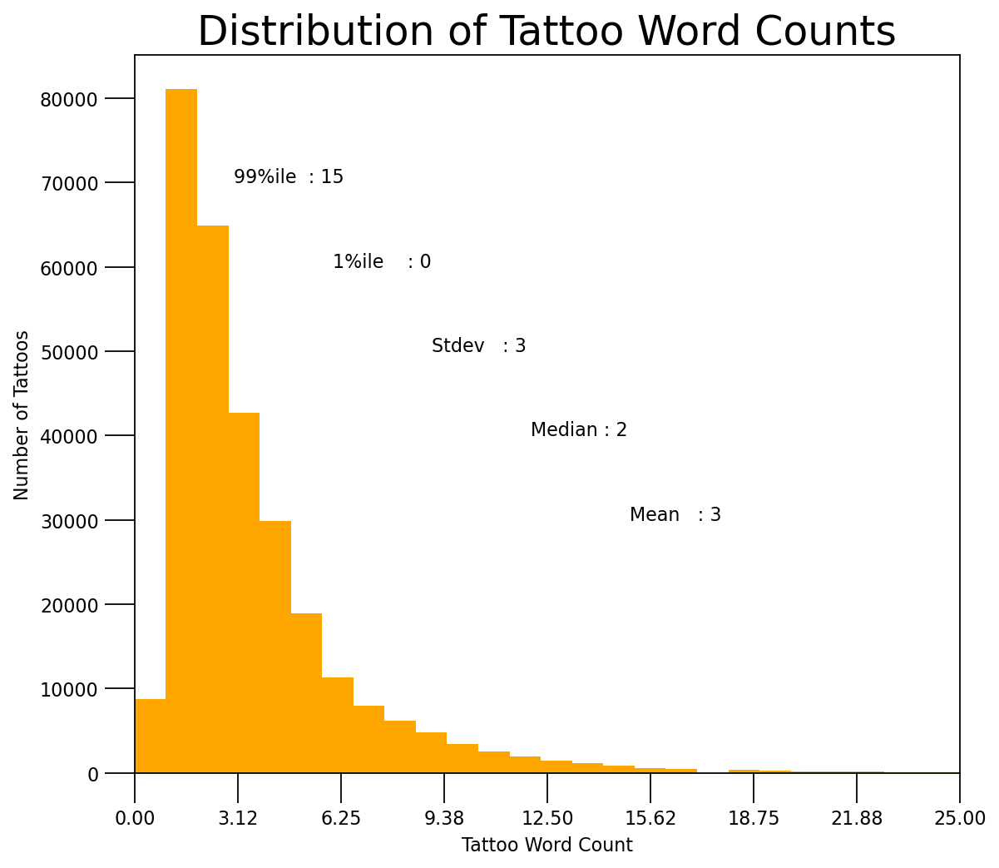

In [239]:
doc_lens = [len(d) for d in df_dominant_topic.Text]

# Plot
plt.figure(figsize=(8,7), dpi=160)
plt.hist(doc_lens, bins = 75, color='orange')
plt.text(15, 30000, "Mean   : " + str(round(np.mean(doc_lens))))
plt.text(12,  40000, "Median : " + str(round(np.median(doc_lens))))
plt.text(9,  50000, "Stdev   : " + str(round(np.std(doc_lens))))
plt.text(6,  60000, "1%ile    : " + str(round(np.quantile(doc_lens, q=0.01))))
plt.text(3,  70000, "99%ile  : " + str(round(np.quantile(doc_lens, q=0.99))))

plt.gca().set(xlim=(0, 25), ylabel='Number of Tattoos', xlabel='Tattoo Word Count')
plt.tick_params(size=16)
plt.xticks(np.linspace(0,25,9))
plt.title('Distribution of Tattoo Word Counts', fontdict=dict(size=22))
plt.show()

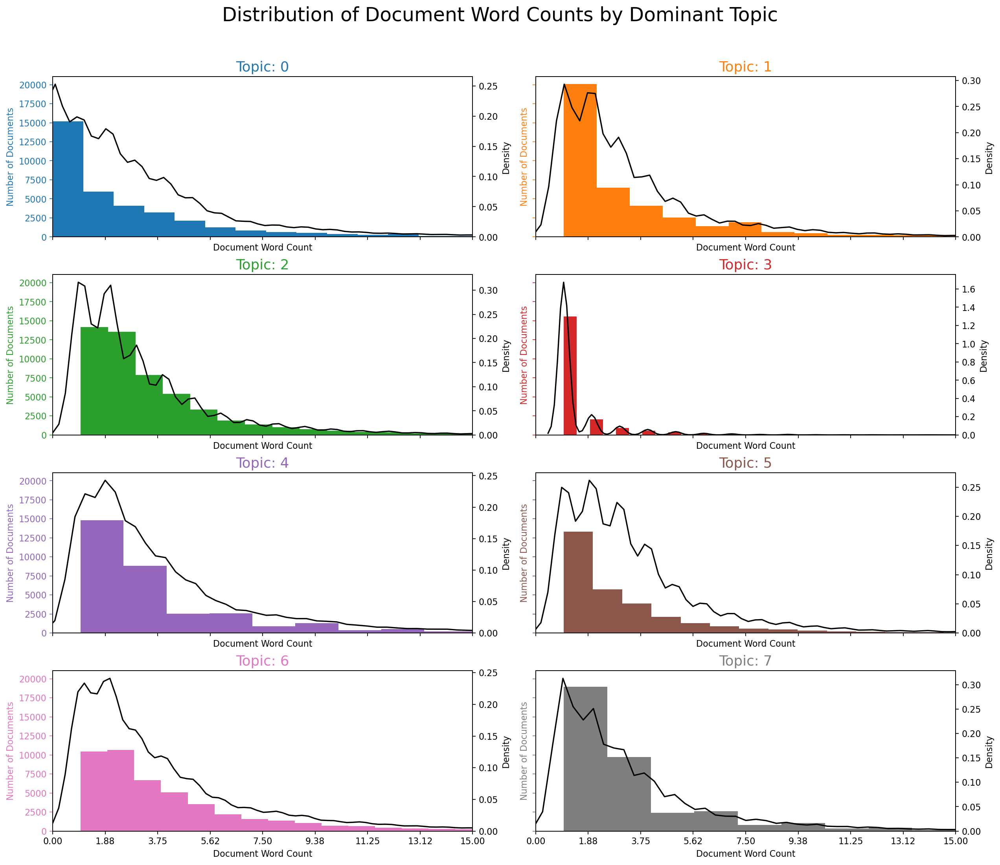

In [252]:
import seaborn as sns
import matplotlib.colors as mcolors
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

fig, axes = plt.subplots(4,2,figsize=(16,14), dpi=160, sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):    
    df_dominant_topic_sub = df_dominant_topic.loc[df_dominant_topic.Dominant_Topic == i, :]
    doc_lens = [len(d) for d in df_dominant_topic_sub.Text]
    ax.hist(doc_lens, bins = 45, color=cols[i])
    ax.tick_params(axis='y', labelcolor=cols[i], color=cols[i])
    sns.kdeplot(doc_lens, color="black", fill=False, ax=ax.twinx())
    ax.set(xlim=(0, 15), xlabel='Document Word Count')
    ax.set_ylabel('Number of Documents', color=cols[i])
    ax.set_title('Topic: '+str(i), fontdict=dict(size=16, color=cols[i]))

fig.tight_layout()
fig.subplots_adjust(top=0.90)
plt.xticks(np.linspace(0,15,9))
fig.suptitle('Distribution of Document Word Counts by Dominant Topic', fontsize=22)
plt.show()

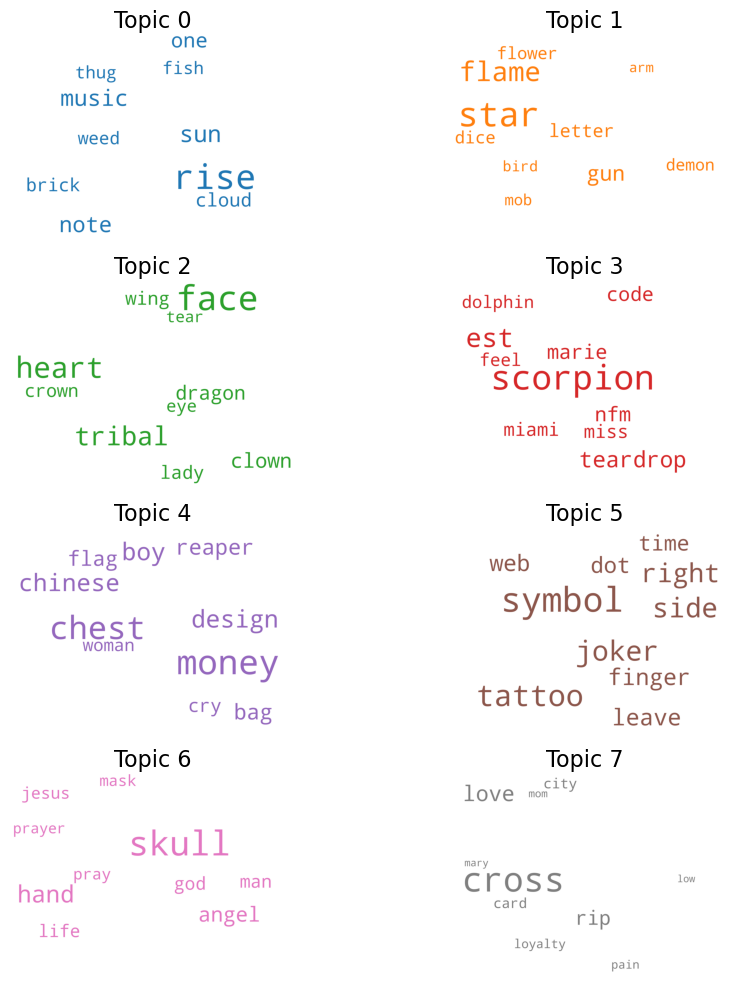

In [332]:
# 1. Wordcloud of Top N words in each topic
from matplotlib import pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]  # more colors: 'mcolors.XKCD_COLORS'

cloud = WordCloud(stopwords=stop_words,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=15,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)

topics = lda_model.show_topics(formatted=False)

fig, axes = plt.subplots(4, 2, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

/var/folders/b9/cjkpbjbd14n0ymyqh84czh040000gn/T/ipykernel_1540/790552876.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
/var/folders/b9/cjkpbjbd14n0ymyqh84czh040000gn/T/ipykernel_1540/790552876.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
/var/folders/b9/cjkpbjbd14n0ymyqh84czh040000gn/T/ipykernel_1540/790552876.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
/var/folders/b9/cjkpbjbd14n0ymyqh84czh040000gn/T/ipykernel_1540/790552876.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= '

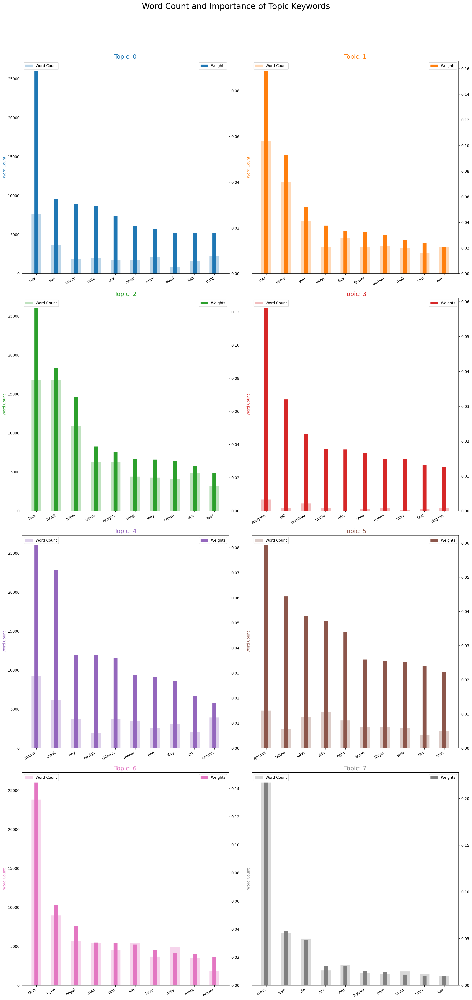

In [286]:
from collections import Counter
topics = lda_model.show_topics(formatted=False)
data_flat = [w for w_list in data_ready for w in w_list]
counter = Counter(data_flat)

out = []
for i, topic in topics:
    for word, weight in topic:
        out.append([word, i , weight, counter[word]])

df = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])        

# Plot Word Count and Weights of Topic Keywords
fig, axes = plt.subplots(4, 2, figsize=(18,36), sharey=True, dpi=160)
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
for i, ax in enumerate(axes.flatten()):
    ax.bar(x='word', height="word_count", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
    ax_twin = ax.twinx()
    ax_twin.bar(x='word', height="importance", data=df.loc[df.topic_id==i, :], color=cols[i], width=0.2, label='Weights')
    ax.set_ylabel('Word Count', color=cols[i])
    # ax_twin.set_ylim(0, 0.450); 
    # ax.set_ylim(1000, 5000)
    ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
    ax.tick_params(axis='y', left=False)
    ax.set_xticklabels(df.loc[df.topic_id==i, 'word'], rotation=30, horizontalalignment= 'right')
    ax.legend(loc='upper left'); ax_twin.legend(loc='upper right')

fig.tight_layout(w_pad=2)    
fig.suptitle('Word Count and Importance of Topic Keywords', fontsize=22, y=1.05)    
plt.show()

In [301]:
corpus[8]

[(33, 1), (34, 1)]

In [311]:
lda_model.id2word.get(31)

'cross'

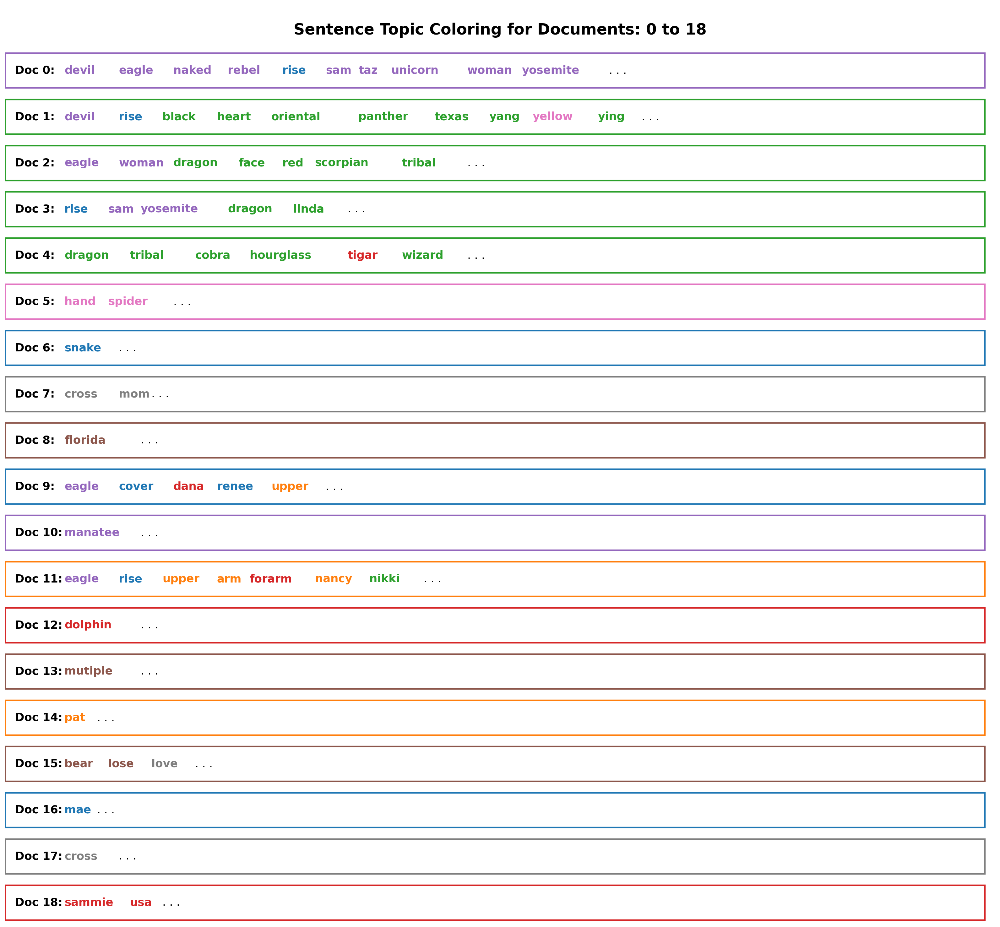

In [330]:
# Sentence Coloring of N Sentences
from matplotlib.patches import Rectangle

def sentences_chart(lda_model=lda_model, corpus=corpus, start = 0, end = 20):
    corp = corpus[start:end]
    mycolors = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    fig, axes = plt.subplots(end-start, 1, figsize=(20, (end-start)*0.95), dpi=160)       
    axes[0].axis('off')
    for i, ax in enumerate(axes):
        if i > 0:
            corp_cur = corp[i-1] 
            topic_percs, wordid_topics, wordid_phivalues = lda_model[corp_cur]
            word_dominanttopic = [(lda_model.id2word.get(wd), topic[0]) for wd, topic in wordid_topics if topic]    
            ax.text(0.01, 0.5, "Doc " + str(i-1) + ": ", verticalalignment='center',
                    fontsize=16, color='black', transform=ax.transAxes, fontweight=700)

            # Draw Rectange
            topic_percs_sorted = sorted(topic_percs, key=lambda x: (x[1]), reverse=True)
            ax.add_patch(Rectangle((0.0, 0.05), 0.99, 0.90, fill=None, alpha=1, 
                                   color=mycolors[topic_percs_sorted[0][0]], linewidth=2))

            word_pos = 0.06
            for j, (word, topics) in enumerate(word_dominanttopic):
                if j < 25:
                    ax.text(word_pos, 0.5, word,
                            horizontalalignment='left',
                            verticalalignment='center',
                            fontsize=16, color=mycolors[topics],
                            transform=ax.transAxes, fontweight=700)
                    word_pos += .011 * len(word)  # to move the word for the next iter
                    ax.axis('off')
            ax.text(word_pos, 0.5, '. . .',
                    horizontalalignment='left',
                    verticalalignment='center',
                    fontsize=16, color='black',
                    transform=ax.transAxes)       
    
    plt.subplots_adjust(wspace=0, hspace=0)
    plt.suptitle('Sentence Topic Coloring for Documents: ' + str(start) + ' to ' + str(end-2), fontsize=22, y=0.95, fontweight=700)
    plt.tight_layout()
    plt.show()

sentences_chart()    

In [331]:
# Sentence Coloring of N Sentences
def topics_per_document(model, corpus, start=0, end=1):
    corpus_sel = corpus[start:end]
    dominant_topics = []
    topic_percentages = []
    for i, corp in enumerate(corpus_sel):
        topic_percs, wordid_topics, wordid_phivalues = model[corp]
        dominant_topic = sorted(topic_percs, key = lambda x: x[1], reverse=True)[0][0]
        dominant_topics.append((i, dominant_topic))
        topic_percentages.append(topic_percs)
    return(dominant_topics, topic_percentages)

dominant_topics, topic_percentages = topics_per_document(model=lda_model, corpus=corpus, end=-1)            

# Distribution of Dominant Topics in Each Document
df = pd.DataFrame(dominant_topics, columns=['Document_Id', 'Dominant_Topic'])
dominant_topic_in_each_doc = df.groupby('Dominant_Topic').size()
df_dominant_topic_in_each_doc = dominant_topic_in_each_doc.to_frame(name='count').reset_index()

# Total Topic Distribution by actual weight
topic_weightage_by_doc = pd.DataFrame([dict(t) for t in topic_percentages])
df_topic_weightage_by_doc = topic_weightage_by_doc.sum().to_frame(name='count').reset_index()

# Top 3 Keywords for each Topic
topic_top3words = [(i, topic) for i, topics in lda_model.show_topics(formatted=False) 
                                 for j, (topic, wt) in enumerate(topics) if j < 3]

df_top3words_stacked = pd.DataFrame(topic_top3words, columns=['topic_id', 'words'])
df_top3words = df_top3words_stacked.groupby('topic_id').agg(', \n'.join)
df_top3words.reset_index(level=0,inplace=True)


- The number of documents for each topic by assigning the document to the topic that has the most weight in that document.
- The number of documents for each topic by by summing up the actual weight contribution of each topic to respective documents.

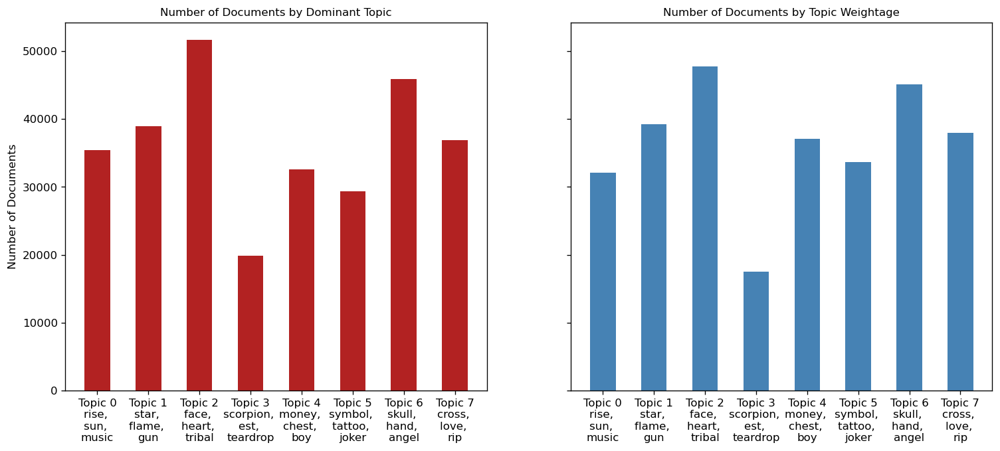

In [338]:
from matplotlib.ticker import FuncFormatter

# Plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6), dpi=120, sharey=True)

# Topic Distribution by Dominant Topics
ax1.bar(x='Dominant_Topic', height='count', data=df_dominant_topic_in_each_doc, width=.5, color='firebrick')
ax1.set_xticks(range(df_dominant_topic_in_each_doc.Dominant_Topic.unique().__len__()))
tick_formatter = FuncFormatter(lambda x, pos: 'Topic ' + str(x)+ '\n' + df_top3words.loc[df_top3words.topic_id==x, 'words'].values[0])
ax1.xaxis.set_major_formatter(tick_formatter)
ax1.set_title('Number of Documents by Dominant Topic', fontdict=dict(size=10))
ax1.set_ylabel('Number of Documents')
# ax1.set_ylim(0, 1000)

# Topic Distribution by Topic Weights
ax2.bar(x='index', height='count', data=df_topic_weightage_by_doc, width=.5, color='steelblue')
ax2.set_xticks(range(df_topic_weightage_by_doc.index.unique().__len__()))
ax2.xaxis.set_major_formatter(tick_formatter)
ax2.set_title('Number of Documents by Topic Weightage', fontdict=dict(size=10))

plt.show()

In [341]:
# Get topic weights and dominant topics ------------
from sklearn.manifold import TSNE
from bokeh.plotting import figure, output_file, show
from bokeh.models import Label
from bokeh.io import output_notebook

# Get topic weights
topic_weights = []
for i, row_list in enumerate(lda_model[corpus]):
    topic_weights.append([w for i, w in row_list[0]])

# Array of topic weights    
arr = pd.DataFrame(topic_weights).fillna(0).values

# Keep the well separated points (optional)
arr = arr[np.amax(arr, axis=1) > 0.35]

# Dominant topic number in each doc
topic_num = np.argmax(arr, axis=1)

# tSNE Dimension Reduction
tsne_model = TSNE(n_components=2, verbose=1, random_state=0, angle=.99, init='pca')
tsne_lda = tsne_model.fit_transform(arr)

# Plot the Topic Clusters using Bokeh
output_notebook()
n_topics = 8
mycolors = np.array([color for name, color in mcolors.TABLEAU_COLORS.items()])
plot = figure(title="t-SNE Clustering of {} LDA Topics".format(n_topics), 
              width=900, height=700)
plot.scatter(x=tsne_lda[:,0], y=tsne_lda[:,1], color=mycolors[topic_num])
show(plot)


/opt/homebrew/Caskroom/miniforge/base/envs/dsba/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 219590 samples in 0.066s...
[t-SNE] Computed neighbors for 219590 samples in 6.837s...
[t-SNE] Computed conditional probabilities for sample 1000 / 219590
[t-SNE] Computed conditional probabilities for sample 2000 / 219590
[t-SNE] Computed conditional probabilities for sample 3000 / 219590
[t-SNE] Computed conditional probabilities for sample 4000 / 219590
[t-SNE] Computed conditional probabilities for sample 5000 / 219590
[t-SNE] Computed conditional probabilities for sample 6000 / 219590
[t-SNE] Computed conditional probabilities for sample 7000 / 219590
[t-SNE] Computed conditional probabilities for sample 8000 / 219590
[t-SNE] Computed conditional probabilities for sample 9000 / 219590
[t-SNE] Computed conditional probabilities for sample 10000 / 219590
[t-SNE] Computed conditional probabilities for sample 11000 / 219590
[t-SNE] Computed conditional probabilities for sample 12000 / 219590
[t-SNE] Computed conditional probabi

/opt/homebrew/Caskroom/miniforge/base/envs/dsba/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:996: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  warnings.warn(


[t-SNE] KL divergence after 250 iterations with early exaggeration: 98.286514
[t-SNE] KL divergence after 1000 iterations: 2.919609


Loading BokehJS ...

In [345]:
import pyLDAvis.gensim_models
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, dictionary=lda_model.id2word)
vis

/opt/homebrew/Caskroom/miniforge/base/envs/dsba/lib/python3.10/site-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  by='saliency', ascending=False).head(R).drop('saliency', 1)
/opt/homebrew/Caskroom/miniforge/base/envs/dsba/lib/python3.10/site-packages/joblib/externals/loky/backend/resource_tracker.py:117: UserWarning: resource_tracker: process died unexpectedly, relaunching.  Some folders/sempahores might leak.
  warnings.warn('resource_tracker: process died unexpectedly, '
/opt/homebrew/Caskroom/miniforge/base/envs/dsba/lib/python3.10/multiprocessing/resource_tracker.py:104: UserWarning: resource_tracker: process died unexpectedly, relaunching.  Some resources might leak.
  warnings.warn('resource_tracker: process died unexpectedly, '


TerminatedWorkerError: A worker process managed by the executor was unexpectedly terminated. This could be caused by a segmentation fault while calling the function or by an excessive memory usage causing the Operating System to kill the worker.

The exit codes of the workers are {SIGKILL(-9), SIGKILL(-9), SIGKILL(-9), SIGKILL(-9), SIGKILL(-9), SIGKILL(-9), SIGKILL(-9), SIGKILL(-9), SIGKILL(-9), SIGKILL(-9)}